1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step - loss: 0.7957
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.7799
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.8221
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.8135
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.8956
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.8517
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.7700
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━

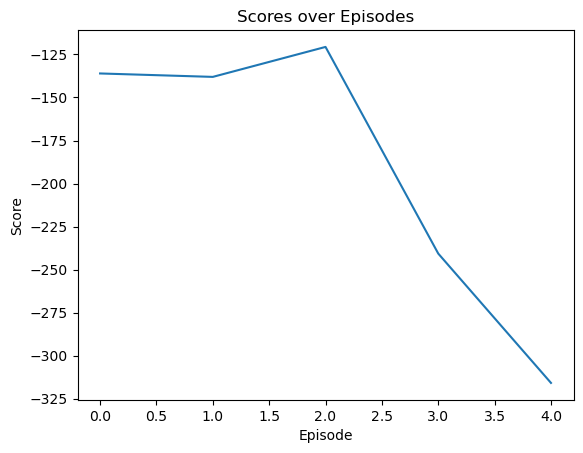

In [21]:
import gym
import sys
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, regularizers
from collections import deque
import random
import matplotlib.pyplot as plt
#CR 301333287

#setting up the environment
env = gym.make('LunarLander-v2')

#dqn agent
class DQNAgent:
    def __init__(self, state_size, action_size, learning_rate):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000)
        self.gamma = 0.99
        self.epsilon = 1.0
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.999
        self.learning_rate = learning_rate
        self.model = self._build_model()

    def _build_model(self):
        model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(shape=(self.state_size,)),
            tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            tf.keras.layers.Dense(self.action_size, activation='linear')
        ])
        optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate, clipnorm=1.0)
        model.compile(loss='mse', optimizer=optimizer)
        return model

    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        act_values = self.model.predict(state)
        return np.argmax(act_values[0])

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def replay(self, batch_size):
        if len(self.memory) < batch_size:
            return

        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state, done in minibatch:
            target = reward if done else reward + self.gamma * np.amax(self.model.predict(next_state)[0])
            target_f = self.model.predict(state)
            target_f[0][action] = target
            self.model.fit(state, target_f, epochs=1, verbose=1) 
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
            print(f"Epsilon: {self.epsilon}")  
            
#params
state_size = env.observation_space.shape[0]
action_size = env.action_space.n
agent = DQNAgent(state_size, action_size, learning_rate=0.0001)
batch_size = 64

#training
def train_dqn(episodes):
    scores = []
    for e in range(episodes):
        raw_state, info = env.reset()
        state = np.reshape(raw_state, [1, state_size])
        total_reward = 0
        for time in range(2000):
            action = agent.act(state)
            step_result = env.step(action)
            if isinstance(step_result, tuple) and len(step_result) == 5:
                next_state, reward, done, _, _ = step_result
                next_state = np.reshape(next_state, [1, state_size])
                agent.remember(state, action, reward, next_state, done)
                state = next_state
                total_reward += reward
                if done:
                    break
                if len(agent.memory) > batch_size:
                    agent.replay(batch_size)
        scores.append(total_reward)
        print(f"Episode: {e + 1}/{episodes}, Total Reward: {total_reward:.2f}, Epsilon: {agent.epsilon:.6f}", flush=True)
    return scores

#init
episodes = 5
scores = train_dqn(episodes)

#plotting
plt.plot(scores)
plt.title('Scores over Episodes')
plt.xlabel('Episode')
plt.ylabel('Score')
plt.show()